# Введение в аналитику. Домашнее задание - 1

Мы будем работать с датасетом про покупки клиентов в онлайн-магазине. По характеристикам клиентов нам нужно понять, купит клиент товар или нет.

Целевая величина - Revenue (факт покупки).

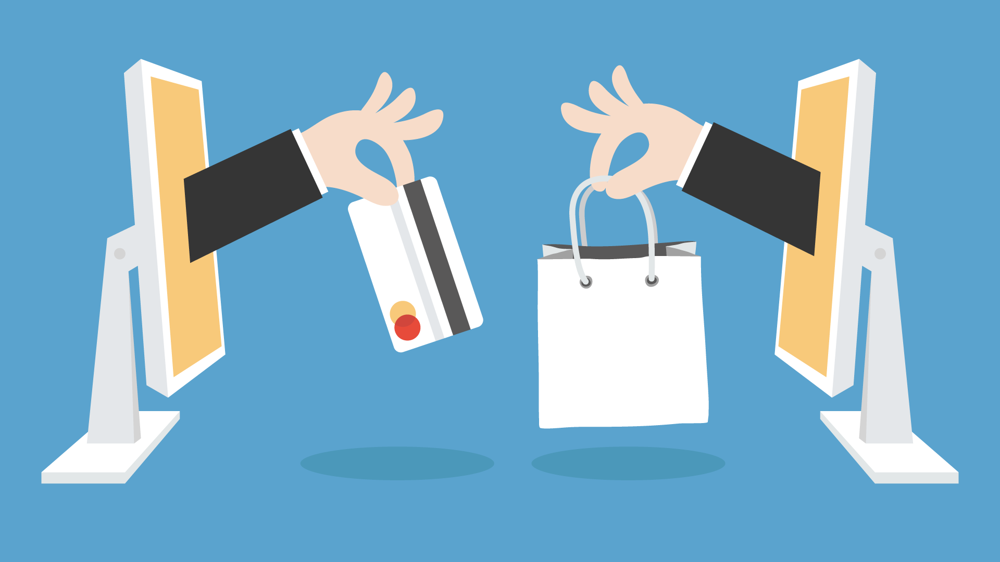

Задания ноутбука проверяются в гугл-формах в полуавтоматическом режиме. Ответы на вопросы, а также ссылку на ноутбук с выполненным домашнем задании в google colab прикрепите в [эту форму](https://docs.google.com/forms/d/e/1FAIpQLSdo_QG4Msqsvxhbd-GsAr8orBhByo1Sg9Y4RtzBX2w5FN43QQ/viewform?usp=sf_link).

* Задание 0 не оценивается
* Задания 1-16 весят 1 балл
* Задания 17-18 весят по 2 балла

[Pandas cheatsheet](https://images.datacamp.com/image/upload/v1676302204/Marketing/Blog/Pandas_Cheat_Sheet.pdf)

## Импорт библиотек и загрузка данных

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
DATASET = "https://raw.githubusercontent.com/aiedu-courses/eda_and_dev_tools/main/datasets/online_shoppers_intention.csv"

In [ ]:
df = pd.read_csv(DATASET)

df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


## Описание данных

**Online Shoppers Purchasing Intention Dataset**

The `Revenue` attribute can be used as the class label.

* `Administrative`, `Administrative Duration`, `Informational`, `Informational Duration`, `Product Related` and `Product Related Duration` represent the number of different types of pages visited by the visitor in that session and total time spent in each of these page categories. The values of these features are derived from the URL information of the pages visited by the user and updated in real time when a user takes an action, e.g. moving from one page to another.

* `Bounce Rate`, `Exit Rate` and `Page Value` features represent the metrics measured by "Google Analytics" for each page in the e-commerce site. The value of Bounce Rate feature for a web page refers to the percentage of visitors who enter the site from that page and then leave ("bounce") without triggering any other requests to the analytics server during that session. The value of "Exit Rate" feature for a specific web page is calculated as for all pageviews to the page, the percentage that were the last in the session. The Page Value feature represents the average value for a web page that a user visited before completing an e-commerce transaction.

* The `Special Day` feature indicates the closeness of the site visiting time to a specific special day (e.g. Mother’s Day, Valentine's Day) in which the sessions are more likely to be finalized with transaction. The value of this attribute is determined by considering the dynamics of e-commerce such as the duration between the order date and delivery date. For example, for Valentina’s day, this value takes a nonzero value between February 2 and February 12, zero before and after this date unless it is close to another special day, and its maximum value of 1 on February 8.

* The dataset also includes operating system, browser, region, traffic type, visitor type as returning or new visitor, a Boolean value indicating whether the date of the visit is weekend, and month of the year.

## Задание 0

Изучите данные:

* Посмотрите на названия колонок

* Выведите на экран 10 случайных строк таблицы

* Посмотрите на размер таблицы

## Исследование данных

In [ ]:
df.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue'],
      dtype='object')

In [ ]:
df.sample(10)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
278,0,0.000000,0,0.0,5,1162.500000,0.000000,0.025000,0.000000,0.0,Mar,2,2,2,2,Returning_Visitor,False,False
246,0,0.000000,0,0.0,14,NaN,0.015385,0.041026,0.000000,0.0,Mar,2,2,8,1,Returning_Visitor,False,False
459,0,0.000000,0,0.0,14,2425.000000,0.000000,0.007143,0.000000,0.0,Mar,2,2,1,3,Returning_Visitor,False,False
8399,1,18.000000,0,0.0,29,765.392857,0.000000,0.000893,0.000000,0.0,Nov,2,2,8,3,New_Visitor,False,False
6499,3,70.933333,3,560.0,16,810.833333,0.000000,0.028070,9.163038,0.0,Jul,2,2,1,2,Returning_Visitor,False,False
3038,3,65.500000,2,12.0,39,1101.333333,0.009524,0.041270,14.996429,0.0,May,2,2,3,1,Returning_Visitor,False,False
8936,0,0.000000,0,0.0,36,2070.325000,0.008333,0.030926,0.000000,0.0,Dec,1,1,1,2,Returning_Visitor,False,False
1923,8,195.316667,0,0.0,54,1063.950000,0.000000,0.019048,54.248864,0.0,Mar,2,2,1,2,Returning_Visitor,False,False
1487,7,81.250000,0,0.0,37,1500.422543,0.014634,0.015339,39.035804,0.0,Mar,2,4,1,2,Returning_Visitor,False,False
7080,10,291.235714,0,0.0,36,940.104427,0.000000,0.002846,87.306958,0.0,Aug,2,2,2,2,Returning_Visitor,False,True


In [ ]:
df.shape

(12330, 18)

## Задание 1

В скольких столбцах таблицы есть пропущенные значения?

In [ ]:
df.isnull().any().sum()

3

## Задание 2

В скольких числовых столбцах медиана больше среднего значения?

In [ ]:
numdf = df.select_dtypes(include='number')
(numdf.median() > numdf.median()).sum()

0

## Задание 3

Сколько дублирующихся строк в данных? Ответьте на вопрос, а затем удалите дубликаты.

In [ ]:
df.duplicated().sum()

109

In [ ]:
df = df.drop_duplicates()

In [ ]:
df.duplicated().sum()

0

## Однофакторный анализ

Начнём с анализа признака Product Related Duration.

## Задание 4

Постройте гистограмму распределения признака Product Related Duration.

Что можно сказать по гистограмме?

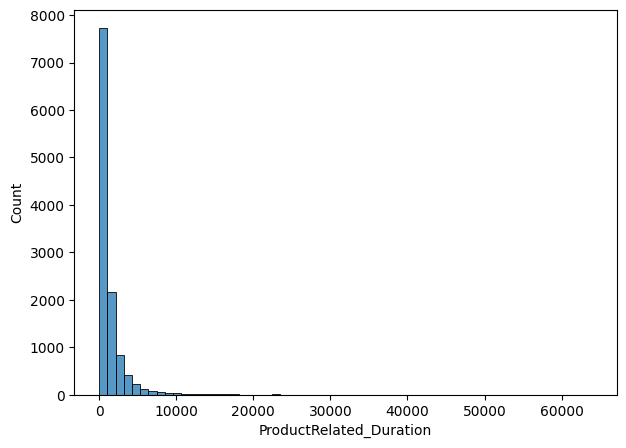

In [ ]:
plt.figure(figsize=(7,5))

sns.histplot(df.ProductRelated_Duration, bins=60);

Можем заметить, что большая часть пользователей не смотрит рекламу, так как самый высокий столбец (около 8000) находится в значение около 0

## Задание 5

Какая доля среди всех клиентов провела 0 минут/секунд на страницах, посвященных продукту? Ответ переведите в проценты и округлите до целого числа.

In [ ]:
a = 100 * len(df[df.ProductRelated_Duration == 0]) / len(df)
round(a)

5

## Задание 6

Посмотрите как данный признак влияет на целевую переменную Revenue и сделайте выводы.


<ipython-input-14-92c713102600>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Revenue',y='ProductRelated_Duration',  data = df, palette='summer')


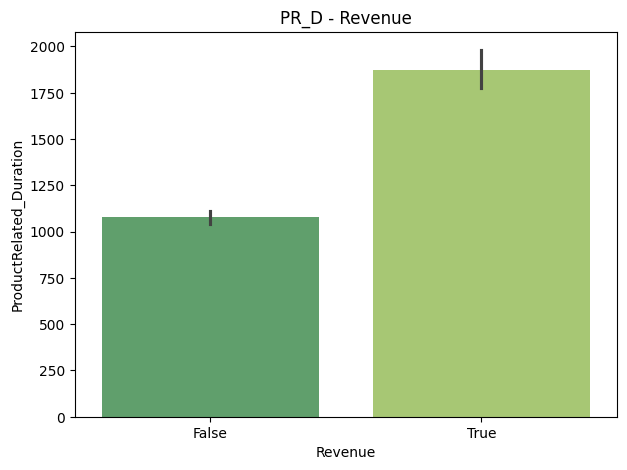

In [ ]:
plt.figure(figsize=(7,5))
sns.barplot(x='Revenue',y='ProductRelated_Duration',  data = df, palette='summer')
plt.title('PR_D - Revenue')
plt.show()

Пользователи, сделавшие покупку, отличаются большей продолжительностью нахождения на сайте, в отличие от тех, кто покупку не делал

## Задание 7

Исходя из полученной гистограммы, сформулируйте гипотезу о взаимосвязи этих двух факторов. Затем выберите подходящий статистический тест (вам поможет любой мануал по статистике или генеративная модель), проведите его и проанализируйте результат (примите уровень значимости равным 0.95).

𝐻0: Распределение Product Related_Duration одинаково для пользователей, совершивших покупку, и для тех, кто этого не делал

𝐻𝑎: Распределение Product Related_Duration отличается для пользователей, совершивших покупку, и для тех, кто этого не делал

In [ ]:
import scipy.stats as stats
from scipy.stats import mannwhitneyu
df1 = df.dropna()
group1 = df1[df1['Revenue'] == True]['ProductRelated_Duration']
group2 = df1[df1['Revenue'] == False]['ProductRelated_Duration']

stat, p_val = stats.mannwhitneyu(group1, group2)
print(f"Mann-Whitney U test p-value: {p_val}")
if p_val < 0.05:
    print('Отвергаем нулевую гипотезу на уровне значимости 95%')
else:
    print('Не отвергаем нулевую гипотезу на уровне значимости 95%')

Mann-Whitney U test p-value: 1.0975144795941307e-111
Отвергаем нулевую гипотезу на уровне значимости 95%


## Задание 8

В поле для ответа запишите название статистического теста, который вы использовали, и обоснование, почему вы взяли именно этот тест.

Mann-Whitney U test

Данный тест используется для сравнения двух независимых выборок, когда данные не обязательно следуют нормальному распределению. Он проверяет, есть ли статистически значимая разница между медианами двух групп. В нашем случае мы сравниваем время, проведенное на страницах, посвященных продукту, между пользователями, которые совершили покупку, и теми, кто не совершил покупку


## Задание 9

Постройте матрицу корреляций всех числовых столбцов друг с другом. Используйте корреляцию Спирмена.

Какой столбец наиболее сильно коррелирует с Revenue? В ответе укажите значение коэффициента корреляции, округленного до сотых.

Наиболее сильно коррелирует: PageValues
Значение коэффициента корреляции: 0.63


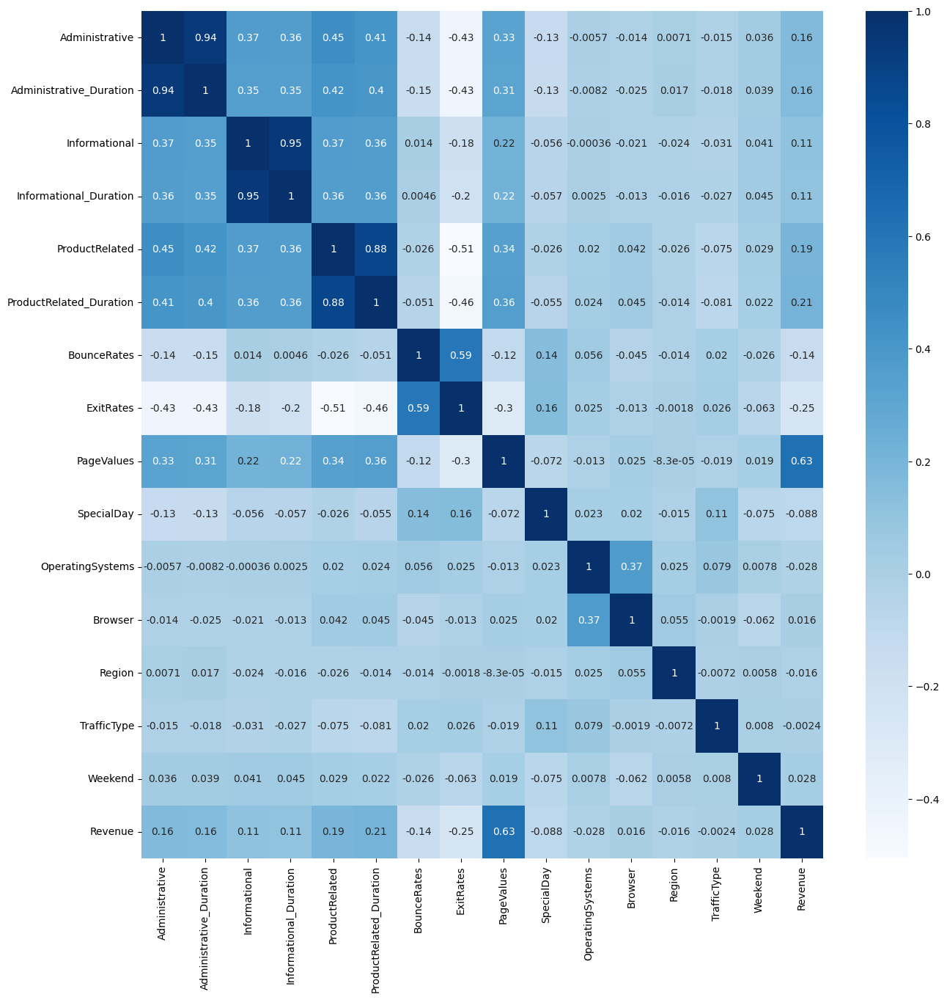

In [ ]:
corr = df.corr(method='spearman', numeric_only=True)
plt.figure(figsize=(15,15))
sns.heatmap(corr, cmap="Blues", annot=True);
r_corr = corr['Revenue'].drop('Revenue')
most_col = r_corr.idxmax()
max_corr = round(r_corr.max(), 2)
print(f'Наиболее сильно коррелирует: {most_col}')
print(f'Значение коэффициента корреляции: {max_corr}')

## Задание 10

Возьмите столбец, который имеет корреляцию с Revenue, равную по модулю 0.14, и проведите анализ этого столбца по аналогии с тем, как вы действовали со столбцом ProductRelated_Duration.

Постройте гистограмму распределения столбца. Какое у него распределение?

Axes(0.125,0.11;0.775x0.77)
Statistic: 0.485310994208743, p-value: 1.2170835195941857e-103
Распределение не является нормальным


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 12221.
  res = hypotest_fun_out(*samples, **kwds)


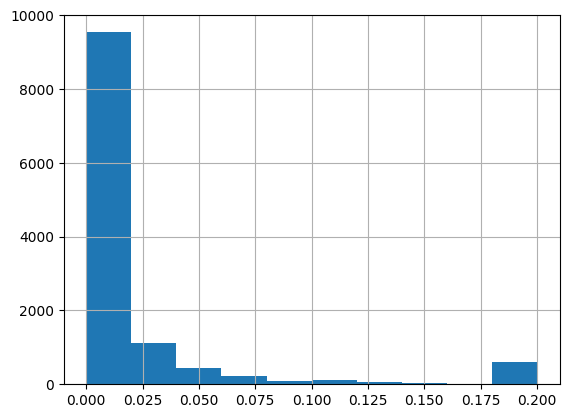

In [ ]:
col = 'BounceRates'
print(df[col].hist())
stat, p_val = stats.shapiro(df[col])
print(f'Statistic: {stat}, p-value: {p_val}')
if p_val < 0.05:
    print('Распределение не является нормальным')
else:
    print('Нормальное распределение')

## Задание 11

Посмотрите как данный признак влияет на целевую переменную Revenue и сделайте выводы.

<ipython-input-18-fce261bb915e>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Revenue', y='BounceRates', data = df, palette='summer')


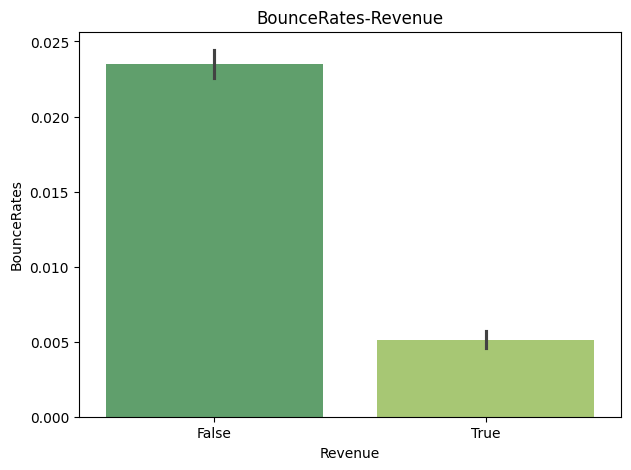

In [ ]:
plt.figure(figsize=(7,5))
sns.barplot(x='Revenue', y='BounceRates', data = df, palette='summer')
plt.title('BounceRates-Revenue')
plt.show()

Более высокий показатель отказов связан с меньшей вероятностью покупки

## Задание 12

Исходя из полученной гистограммы, сформулируйте гипотезу о взаимосвязи этих двух факторов. Затем выберите подходящий статистический тест (вам поможет любой мануал по статистике или генеративная модель), проведите его и проанализируйте результат (примите уровень значимости равным 0.95).

𝐻0: Распределение BounceRates одинаково для пользователей, совершивших покупку, и для тех, кто этого не делал

𝐻𝑎: Распределение BounceRates  отличается для пользователей, совершивших покупку, и для тех, кто этого не делал (обратная пропорциональность)

In [ ]:
df2 = df.dropna()
group1 = df2[df2['Revenue'] == True]['BounceRates']
group2 = df2[df2['Revenue'] == False]['BounceRates']

stat, p_val = stats.mannwhitneyu(group1, group2)
print(f"Mann-Whitney U test p-value: {p_val}")
if p_val < 0.05:
    print('Отвергаем нулевую гипотезу на уровне значимости 95%')
else:
    print('Не отвергаем нулевую гипотезу на уровне значимости 95%')

Mann-Whitney U test p-value: 9.235887246934053e-54
Отвергаем нулевую гипотезу на уровне значимости 95%


## Задание 13

В поле для ответа запишите название статистического теста, который вы использовали, и обоснование, почему вы взяли именно этот тест.

Данный тест используется для сравнения двух независимых выборок, когда данные не обязательно следуют нормальному распределению (в задание10 мы убедились, что распредение не является нормальным). Он проверяет, есть ли статистически значимая разница между медианами двух групп. В нашем случае мы сравниваем bounce rate между пользователями, которые совершили покупку, и теми, кто не совершил покупку

## Задание 14

Столбцы OperatingSystems, Browser, Region, TrafficType, Weekend - на самом деле категориальные, а не числовые. Измените тип этих столбцов на `object`.

На данных момент сколько теперь столбцов в таблице имеют тип `object`?

In [ ]:
df[['OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Weekend']] = df[['OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Weekend']].astype('object')
df.select_dtypes(include='object').shape[1]

7

## Задание 15

Переведите Revenue в категории по правилу: True -> Yes, False -> No.

После этого постройте аналог матрицы корреляций между парами категориальных столбцов с помощью V-меры Крамера.

Какой категориальный столбец сильнее всего "коррелирует" с Revenue?



In [ ]:
!pip install association-metrics -q

  Preparing metadata (setup.py) ... done


In [ ]:
import association_metrics as am
df['Revenue'] = df['Revenue'].apply(lambda x: 'Yes' if x == True else ('No' if x == False else x))
df_cat = df.apply(lambda x: x.astype("category") if x.dtype == "object" else x)
cramersv = am.CramersV(df_cat)
cramersv.fit()

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
Month,1.000000,0.062831,0.066652,0.046936,0.190177,0.137443,0.065412,0.175961
OperatingSystems,0.062831,1.000000,0.594720,0.114603,0.191472,0.453646,0.119875,0.078437
Browser,0.066652,0.594720,1.000000,0.125797,0.189186,0.504222,0.087512,0.048904
Region,0.046936,0.114603,0.125797,1.000000,0.085438,0.174016,0.029911,0.028040
TrafficType,0.190177,0.191472,0.189186,0.085438,1.000000,0.375859,0.150928,0.171864
VisitorType,0.137443,0.453646,0.504222,0.174016,0.375859,1.000000,0.053418,0.103550
Weekend,0.065412,0.119875,0.087512,0.029911,0.150928,0.053418,1.000000,0.027858
Revenue,0.175961,0.078437,0.048904,0.028040,0.171864,0.103550,0.027858,1.000000


Верните Revenue обратно к типу Bool.

In [ ]:
df['Revenue'] = df['Revenue'].replace({'Yes': True, 'No': False}).astype('bool')

## Задание 16

Постройте матрицу $\phi_k$-корреляций всех столбцов в таблице.

Какой фактор сильнее всего коррелирует с Revenue? В ответе укажите значение корреляции, округленное до сотых.

In [ ]:
!pip install phik -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 2.5 MB/s eta 0:00:00


interval columns not set, guessing: ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay']
Наиболее сильно коррелирует: PageValues
Значение коэффициента корреляции: 0.41


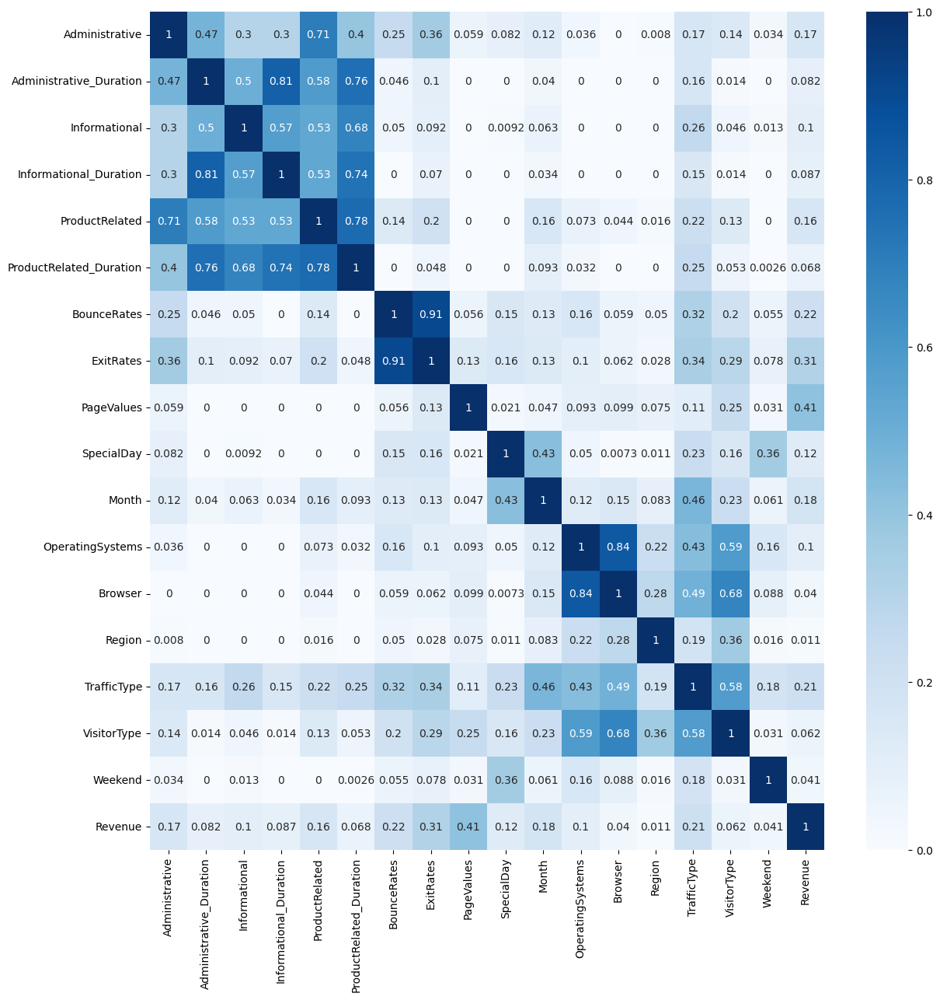

In [ ]:
import phik
plt.figure(figsize=(14,14))
ph = df.phik_matrix()
sns.heatmap(ph, cmap="Blues", annot=True)


corr = ph['Revenue'].drop('Revenue')
most_col = corr.idxmax()
max_corr = corr.max()
print(f'Наиболее сильно коррелирует: {most_col}')
print(f'Значение коэффициента корреляции: {round(max_corr, 2)}')


## Задание 17

Постройте любой из рассмотренных в первом занятии курса дашборд по данным, сохраните его в html и скачайте себе на компьютер.

Выложите файл с дашбордом на яндекс/гугл-диск и прикрепите ссылку на него в этом задании.

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q

     | 17.8 MB 28.8 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 36.5 MB/s eta 0:00:00


In [ ]:
from ydata_profiling import ProfileReport

In [ ]:
df_copy = pd.read_csv(DATASET)

profile_report = ProfileReport(df_copy, title='Report')

In [ ]:
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_report.to_file('report.html')

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
from google.colab import files
files.download('report.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

https://drive.google.com/file/d/19mS5zzFbLVuOKsYslO8ySrzU75RmDlPy/view?usp=sharing

## Задание 18

Наша цель - понять, какие факторы сильнее всего влияют на Revenue и почему.

Проанализируйте построенный дашборд и ответьте текстом на вопросы:

1) Есть ли проблемы в данных (пропуски, дубли, выбросы, ошибочные значения)?

2) Какие три фактора имеют наиболее сильное влияние на Revenue?

3) Постарайтесь описать смысл каждого из этих факторов, а также для каждого из этих факторов объясните по смыслу, почему он сильно влияет на Revenue

4) Укажите два наиболее коррелирующих между собой фактора (без учета Revenue) и объясните, почему между ними такая большая корреляция?

1) Да, есть пропуски в Informational_Duration (1,6%), ProductRelated_Duration (4%) и ExitRates (0,8%). Есть дубли (0,6%).

2)PageValues, ExitRates, Month

3) Page Value -  показатель того, как страница способствует общему доходу сайта. Более высокий Page Value означает, что пользователи, которые посещают эту страницу, более склонны к завершению покупки, что напрямую увеличивает доход.

Exit Rate показывает, насколько вероятно, что пользователь покинет сайт после просмотра этой страницы. Высокий Exit Rate говорит о том, что страница хорошо удерживает пользователей и способствует дальнейшему взаимодействию.

Month — это месяц года, в который была произведена покупка или посещение. Это категориальная переменная, отражающая сезонные изменения и влияние времени года на поведение пользователей.

4) Administrative и Administrative_Duration - самая высокая положительная корреляция. Если пользователь проводит больше времени на административных страницах, то, скорее всего, он и просматривает их больше.

ProductRelated и ProductRelated_Duration - также  высокая положительная корреляция. Такая же логика, как и в предыдущем примере.

## Полезные доп. материалы

* [Введение в проверку гипотез (кратко)](https://www.codecamp.ru/blog/hypothesis-testing/)

* [Введение в проверку гипотез (подробнее)](https://law.bsu.by/pub/11/barvenov_4.pdf)

* [Основные виды распределений](https://habr.com/ru/articles/801101/)